In [1]:
import os
import pandas as pd
import numpy as np
import json
import matplotlib.pyplot as plt
plt.style.use('fivethirtyeight')
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from tqdm.notebook import tqdm
import collections
import pickle
import gc

In [2]:
# Read all files
json_files=[]
csv_files=[]
for dirname, _, filenames in os.walk('archive'):
    for filename in filenames:
        fname=os.path.join(dirname, filename)
        if fname.endswith('csv'):
            csv_files.append(fname)
        elif fname.endswith('json'):
            json_files.append(fname)
            
            
# Reorder CSV files
country_codes=list(map(lambda string:''.join(list(filter(lambda word:word.isupper(),string))),csv_files))

country_codes, order=zip(*sorted(list(zip(country_codes,range(len(country_codes)))), key=lambda val:val[0]))
csv_files=[csv_files[ind] for ind in order]

# Reorder json files
country_codes=list(map(lambda string:''.join(list(filter(lambda word:word.isupper(),string))),json_files))
country_codes,order=zip(*sorted(list(zip(country_codes,range(len(country_codes)))), key=lambda val:val[0]))
json_files=[json_files[ind] for ind in order]


def initialize_country_dataframe(dataframe,json_fname,country_code):
    '''First, remove duplicate rows from the dataframe, second, map category_id column to actual categories, third,
    new column in the dataframe called country_code'''
    
    df=dataframe.copy()
    df.drop_duplicates(inplace=True)
    
    with open(json_fname,'r') as f:
        json_data=json.loads(f.read())

    mapping_dict=dict([(int(dictionary['id']),dictionary['snippet']['title']) for dictionary in json_data['items']])

    df['category']=df['category_id'].replace(mapping_dict)
    del df['category_id']

    df['country_code']=country_code
    
    return df

# Initialize country-by-country dataframe using above written function
dataframes=[]
for ind,code in enumerate(country_codes):
    try:
        df=pd.read_csv(csv_files[ind])
    except:
        df=pd.read_csv(csv_files[ind],engine='python')
                
    df=initialize_country_dataframe(df,json_files[ind],code)
    print(code,df.shape)
    dataframes.append(df)
    
    
# Concatenate individual dataframe to form single main dataframe
dataframe=pd.concat(dataframes)
print(dataframe.shape)


# Remove videos with unknown video id
drop_index=dataframe[dataframe.video_id.isin(['#NAME?','#VALUE!'])].index
dataframe.drop(drop_index, axis=0, inplace=True)

CA (40881, 17)
DE (40840, 17)
FR (40724, 17)
GB (38745, 17)
IN (33089, 17)
JP (14846, 17)
KR (32251, 17)
MX (40402, 17)
RU (40693, 17)
US (40901, 17)
(363372, 17)


In [3]:
dataframes

[          video_id trending_date  \
 0      n1WpP7iowLc      17.14.11   
 1      0dBIkQ4Mz1M      17.14.11   
 2      5qpjK5DgCt4      17.14.11   
 3      d380meD0W0M      17.14.11   
 4      2Vv-BfVoq4g      17.14.11   
 ...            ...           ...   
 40876  sGolxsMSGfQ      18.14.06   
 40877  8HNuRNi8t70      18.14.06   
 40878  GWlKEM3m2EE      18.14.06   
 40879  lbMKLzQ4cNQ      18.14.06   
 40880  POTgw38-m58      18.14.06   
 
                                                    title     channel_title  \
 0             Eminem - Walk On Water (Audio) ft. Beyoncé        EminemVEVO   
 1                          PLUSH - Bad Unboxing Fan Mail         iDubbbzTV   
 2      Racist Superman | Rudy Mancuso, King Bach & Le...      Rudy Mancuso   
 3                               I Dare You: GOING BALD!?          nigahiga   
 4            Ed Sheeran - Perfect (Official Music Video)        Ed Sheeran   
 ...                                                  ...               ...   
 

In [4]:
dataframes[0].head()

,video_id,trending_date,title,channel_title,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category,country_code
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music,CA
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,Comedy,CA
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,CA
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,CA
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...,Music,CA


In [5]:
dataframes[1].head()

,video_id,trending_date,title,channel_title,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category,country_code
0,LgVi6y5QIjM,17.14.11,Sing zu Ende! | Gesangseinlagen vom Feinsten |...,inscope21,2017-11-13T17:08:49.000Z,"inscope21|""sing zu ende""|""gesangseinlagen""|""ge...",252786,35885,230,1539,https://i.ytimg.com/vi/LgVi6y5QIjM/default.jpg,False,False,False,Heute gibt es mal wieder ein neues Format... w...,Entertainment,DE
1,Bayt7uQith4,17.14.11,Kinder ferngesteuert im Kiosk! Erwachsene abzo...,LUKE! Die Woche und ich,2017-11-12T22:30:01.000Z,"Kinder|""ferngesteuert""|""Kinder ferngesteuert""|...",797196,53576,302,1278,https://i.ytimg.com/vi/Bayt7uQith4/default.jpg,False,False,False,Kinder ferngesteuert! Kinder lassen sich sooo ...,Comedy,DE
2,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97190,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment,DE
3,AHtypnRk7JE,17.14.11,Das Fermi-Paradoxon,100SekundenPhysik,2017-11-12T15:00:01.000Z,"Physik|""Wissenschaft""|""Technik""|""Science-Ficti...",380247,31821,458,1955,https://i.ytimg.com/vi/AHtypnRk7JE/default.jpg,False,False,False,►Alle Videos: http://bit.ly/1fa7Tw3\n\n\n✚Snap...,Education,DE
4,ZJ9We4bjcg0,17.14.11,18 SONGS mit Kelly MissesVlog (Sing-off),rezo,2017-11-12T13:10:36.000Z,"kelly|""missesvlog""|""kelly song""|""bausa""|""bausa...",822213,100684,2467,10244,https://i.ytimg.com/vi/ZJ9We4bjcg0/default.jpg,False,False,False,18 Song Mashup über den (veränderten) Beat von...,Entertainment,DE


In [6]:
dataframes[9].head()

,video_id,trending_date,title,channel_title,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category,country_code
0,2kyS6SvSYSE,17.14.11,WE WANT TO TALK ABOUT OUR MARRIAGE,CaseyNeistat,2017-11-13T17:13:01.000Z,SHANtell martin,748374,57527,2966,15954,https://i.ytimg.com/vi/2kyS6SvSYSE/default.jpg,False,False,False,SHANTELL'S CHANNEL - https://www.youtube.com/s...,People & Blogs,US
1,1ZAPwfrtAFY,17.14.11,The Trump Presidency: Last Week Tonight with J...,LastWeekTonight,2017-11-13T07:30:00.000Z,"last week tonight trump presidency|""last week ...",2418783,97185,6146,12703,https://i.ytimg.com/vi/1ZAPwfrtAFY/default.jpg,False,False,False,"One year after the presidential election, John...",Entertainment,US
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146033,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,US
3,puqaWrEC7tY,17.14.11,Nickelback Lyrics: Real or Fake?,Good Mythical Morning,2017-11-13T11:00:04.000Z,"rhett and link|""gmm""|""good mythical morning""|""...",343168,10172,666,2146,https://i.ytimg.com/vi/puqaWrEC7tY/default.jpg,False,False,False,Today we find out if Link is a Nickelback amat...,Entertainment,US
4,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095731,132235,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,US


### Feature creation 

In [7]:
# Create feature num_days that indicates the number of days the videos are in trend
video_ids=dataframe.video_id.unique().tolist()
num_days=[]
id_days={}
for vid in tqdm(video_ids):
    days=len(dataframe[dataframe.video_id==vid].trending_date.unique())
    id_days[vid]=days
    num_days.append(days)
    

# Create feature num_countries that indicates the number of countries in the videos trended
video_ids=dataframe.video_id.unique().tolist()
num_countries=[]
id_countries={}
for vid in tqdm(video_ids):
    days=len(dataframe[dataframe.video_id==vid].country_code.unique())
    id_countries[vid]=days
    num_countries.append(days)

  0%|          | 0/178699 [00:00<?, ?it/s]

  0%|          | 0/178699 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [ ]:
num_days

In [ ]:
num_countries

In [ ]:
# Create feature days_lapse that indicates the number of days before videos are in trend
def unique_video_id(keep='last'):
    '''Removes duplicate videos to keep single record according to trending_date and keep argument.'''
    df=dataframe.copy()
    
    df.sort_values(by=['video_id','trending_date'],axis=0,inplace=True)
    df.drop_duplicates(subset='video_id',keep='last',inplace=True)
    
    return df

df=unique_video_id(keep='first')

def publish_date(string):
    return string.split('T')[0]

df['publish_date']=pd.to_datetime(df.publish_time.apply(func=lambda val:publish_date(val)),format='%Y-%m-%d')
df['trending_date']=pd.to_datetime(df.trending_date,format='%y.%d.%m')
df['days_lapse']=df['trending_date']-df['publish_date']

df.days_lapse=df.days_lapse.apply(func=lambda val:val.days).values
id_days_lapse=dict(zip(df.video_id.values,df.days_lapse.values))

def n_days_lapse_replace(vid):
    return id_days_lapse[vid]

dataframe['days_lapse']=dataframe.video_id.apply(func=n_days_lapse_replace)

# Create feature trend_month that indicates month the videos are in trend
def trend_month(string):
    return int(string.split('.')[2])

dataframe['trend_month']=dataframe.trending_date.apply(func=lambda val:trend_month(val))

# Create feature publish_month that indicates the months that the videos are published in
def publish_month(string):
    return int(string.split('T')[0].split('-')[1])
dataframe['publish_month']=dataframe.publish_time.apply(func=lambda val:publish_month(val))

# Create feature publish_hour that indicates the hours that the videos are published in
def publish_hour(string):
    return int(string.split('T')[1].split(':')[0])

dataframe['publish_hour']=dataframe.publish_time.apply(func=lambda val:publish_hour(val))

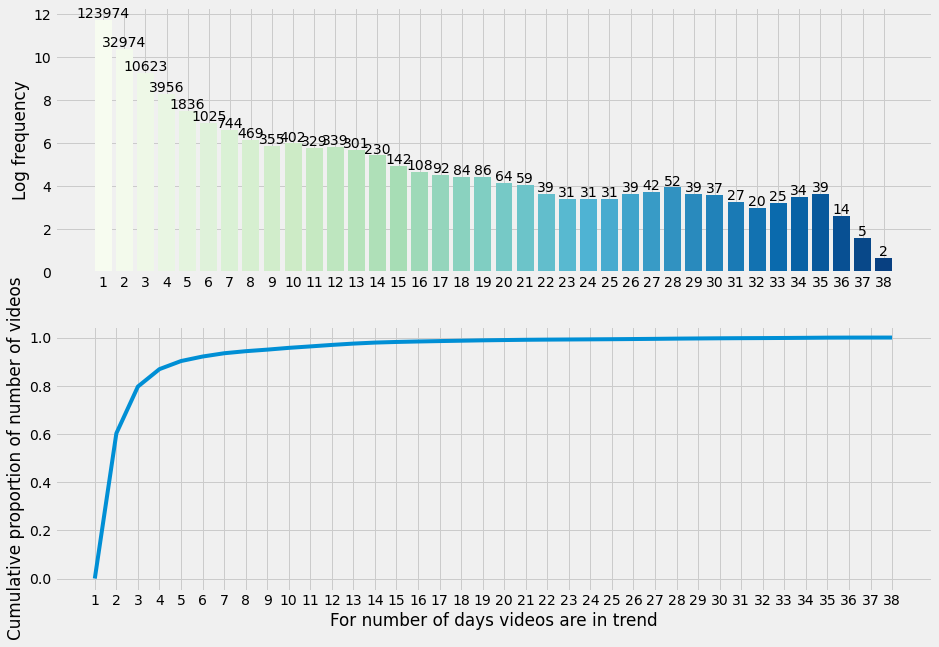

In [8]:


trending_days=collections.Counter(num_days)
days,freq=zip(*sorted(trending_days.items(),key=lambda val:val[0]))

fig,[ax1,ax2]=plt.subplots(nrows=2,ncols=1,figsize=(14,10))

cmap = plt.get_cmap('GnBu') 
colors=[cmap(i) for i in np.linspace(0, 1, len(days))]
ax1.bar(range(len(days)),np.log(freq),color=colors)
ax1.set_xticks(range(len(days)))
ax1.set_xticklabels(days)    

labels=[str(val) for val in freq]
for ind,val in enumerate(np.log(freq)):
    ax1.text(ind,val+0.1,labels[ind],ha='center')

ax1.set_xticks(range(len(days)))
ax1.set_xticklabels(days)

ax1.set_ylabel('Log frequency')

cum_arr=np.cumsum(freq)
max_val=np.max(cum_arr)
min_val=np.min(cum_arr)

ax2.plot((cum_arr-min_val)/(max_val-min_val))
ax2.set_xticks(range(len(days)))
ax2.set_xticklabels(days)
ax2.set_ylabel('Cumulative proportion of number of videos')
ax2.set_xlabel('For number of days videos are in trend');

In [24]:
dataframe

,video_id,trending_date,title,channel_title,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category,country_code
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music,CA
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,Comedy,CA
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,CA
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,CA
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...,Music,CA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40944,BZt0qjTWNhw,18.14.06,The Cat Who Caught the Laser,AaronsAnimals,2018-05-18T13:00:04.000Z,"aarons animals|""aarons""|""animals""|""cat""|""cats""...",1685609,38160,1385,2657,https://i.ytimg.com/vi/BZt0qjTWNhw/default.jpg,False,False,False,The Cat Who Caught the Laser - Aaron's Animals,Pets & Animals,US
40945,1h7KV2sjUWY,18.14.06,True Facts : Ant Mutualism,zefrank1,2018-05-18T01:00:06.000Z,[none],1064798,60008,382,3936,https://i.ytimg.com/vi/1h7KV2sjUWY/default.jpg,False,False,False,NaN,People & Blogs,US
40946,D6Oy4LfoqsU,18.14.06,I GAVE SAFIYA NYGAARD A PERFECT HAIR MAKEOVER ...,Brad Mondo,2018-05-18T17:34:22.000Z,I gave safiya nygaard a perfect hair makeover ...,1066451,48068,1032,3992,https://i.ytimg.com/vi/D6Oy4LfoqsU/default.jpg,False,False,False,I had so much fun transforming Safiyas hair in...,Entertainment,US
40947,oV0zkMe1K8s,18.14.06,How Black Panther Should Have Ended,How It Should Have Ended,2018-05-17T17:00:04.000Z,"Black Panther|""HISHE""|""Marvel""|""Infinity War""|...",5660813,192957,2846,13088,https://i.ytimg.com/vi/oV0zkMe1K8s/default.jpg,False,False,False,How Black Panther Should Have EndedWatch More ...,Film & Animation,US


In [11]:
len(dataframe)

344189

In [13]:
len(video_ids)

178699

In [20]:
%%time
df = dataframe

df = df.drop_duplicates(subset=['video_id'], )
for i, row in df.iterrows():
    if row.video_id == "oV0zkMe1K8s":
        print(f"i: {i} Trending date: {row.trending_date}, trending views that day: {row.views}")

i: 40540 Trending date: 18.12.06, trending views that day: 5590430
Wall time: 19.1 s


In [25]:
id_days

{'n1WpP7iowLc': 14,
 '0dBIkQ4Mz1M': 5,
 '5qpjK5DgCt4': 7,
 'd380meD0W0M': 6,
 '2Vv-BfVoq4g': 14,
 '0yIWz1XEeyc': 1,
 '_uM5kFfkhB8': 3,
 '2kyS6SvSYSE': 7,
 'JzCsM1vtn78': 3,
 '43sm-QwLcx4': 2,
 'U3xLOo-CNwo': 3,
 'FyZMnhUtLfE': 1,
 '7MxiQ4v0EnE': 4,
 'LUzsOyWp9lw': 3,
 'AS9-ITLhQxo': 2,
 'gifPYwArCVQ': 1,
 '8NHA23f7LvU': 1,
 'fy-CuCzaPp8': 1,
 'kzwfHumJyYc': 3,
 'nc99ccSXST0': 6,
 'puqaWrEC7tY': 5,
 '6H3wVsceoS0': 2,
 'PRlmRnU9qts': 2,
 'ZhhXLMbZ1rQ': 1,
 'wuf2KinLxZ8': 2,
 'aVTAU_4i9AY': 1,
 '7779JdxVAg0': 2,
 'jVpp2BUtMoY': 2,
 'j67FgNEvyh8': 2,
 'oQH_rtoHsdQ': 2,
 'm-nZmgHWoEw': 1,
 'V4Uuxg6jmbo': 2,
 'WuTFI5qftCE': 3,
 '_A5Z00E5gx8': 1,
 'wczm1faUZ1Q': 2,
 'uEu5--lyNCE': 1,
 'cTBnDJ77kr0': 2,
 'FSdg3UVuBKE': 1,
 '6xT1Xc7_X3k': 1,
 'GBVxEpQr8R8': 2,
 'JwboxqDylgg': 4,
 't3FYESkzjUI': 1,
 '0gLWN3uq74o': 2,
 '9fNvbeBLwGc': 2,
 'k3GxDSG1c0Y': 2,
 'ThLVteoxnSE': 1,
 'exMNBvwCfRY': 1,
 'c64I9HNpiOY': 4,
 'oo_xQyxgNpg': 2,
 'teXaL6GdQRk': 5,
 '0kErOtN3q_w': 1,
 'TaTleo4cOs8': 5,
 'Nc0ZCtZd

In [28]:
%%time 
for i, row in df.iterrows():
    if id_days[row.video_id] > 5:
        row["trend_over_5_days"] = 1
#         print(f"Vid {row.video_id} trended for {id_days[row.video_id]}")
    else:
        row["trend_over_5_days"] = 0

df

Vid n1WpP7iowLc trended for 14
Vid 5qpjK5DgCt4 trended for 7
Vid d380meD0W0M trended for 6
Vid 2Vv-BfVoq4g trended for 14
Vid 2kyS6SvSYSE trended for 7
Vid nc99ccSXST0 trended for 6
Vid 9t9u_yPEidY trended for 11
Vid gHZ1Qz0KiKM trended for 7
Vid ijJPFowBsBc trended for 13
Vid NVCqz2BDfcQ trended for 11
Vid ItYOdWRo0JY trended for 6
Vid gjXrm2Q-te4 trended for 7
Vid YvfYK0EEhK4 trended for 7
Vid 5530I_pYjbo trended for 7
Vid ve3oQBjcAGI trended for 8
Vid cxMvzK2OQTw trended for 8
Vid 9SK1I0V6U5c trended for 7
Vid Y9nDagqKL7Q trended for 6
Vid DbJ2s_g1oDc trended for 6
Vid vIVaLtJmyPs trended for 13
Vid pcWKpGzhgq4 trended for 7
Vid A5TPOKoE1_M trended for 14
Vid aumXGJnd_hU trended for 6
Vid rvkm8DPbWgc trended for 12
Vid 8-Cjsnq8kVU trended for 8
Vid bAkEd8r7Nnw trended for 7
Vid cmoknv58jjE trended for 7
Vid 8hKbIhrb1WU trended for 11
Vid hpapqEeb36k trended for 11
Vid TWpt-ze_cYU trended for 13
Vid CtBca6H6Teg trended for 7
Vid MMGrzOu1amQ trended for 14
Vid 8KT1UCsOE74 trended for 

Vid UKka73nn1dk trended for 6
Vid vn9mMeWcgoM trended for 11
Vid Bs5Ml7_2wT0 trended for 6
Vid JBDWIGpKnwM trended for 7
Vid NyNQLRhsAsk trended for 6
Vid aj8mN_7Apcw trended for 18
Vid iGXYZwZEZa0 trended for 7
Vid r8FQ5wUYm9c trended for 16
Vid 56KYMMGudcU trended for 15
Vid oXE-ssvbhQA trended for 6
Vid 2sxuAm569IY trended for 6
Vid ceJcHUoO734 trended for 16
Vid S-4rhjO6xYg trended for 7
Vid Ep6-bNu16_I trended for 7
Vid cSp1dM2Vj48 trended for 6
Vid -oOlAGKBXnA trended for 7
Vid RdMWIgZIPD8 trended for 17
Vid 3UoKswz6OQc trended for 7
Vid khPLWaBioOs trended for 19
Vid rRzxEiBLQCA trended for 13
Vid t5Lz14wu1uw trended for 8
Vid ii3n7hYQOl4 trended for 16
Vid YBT_rfVxY5A trended for 17
Vid TOeWI-HClI8 trended for 7
Vid 2yCp-Dj5-7c trended for 6
Vid kXKw2skbLdk trended for 7
Vid a7NJ6Gek9v4 trended for 17
Vid 8oKl_qDJHt4 trended for 6
Vid 4cucHc2vef4 trended for 19
Vid GSCP2yg-v2g trended for 7
Vid fOhB5JyEkOQ trended for 7
Vid h-h5Mhlt6O0 trended for 6
Vid yArprk0q9eE trended for 

Vid 31mjfjIkWiM trended for 10
Vid fN5HV79_8B8 trended for 12
Vid bE89bMMO22I trended for 10
Vid Jcghl0lbDSk trended for 7
Vid k5TqNsr6YuQ trended for 9
Vid a_u7g5BlfiY trended for 6
Vid P6ODTQKhaXk trended for 10
Vid 7LjC-nUPrNg trended for 6
Vid _ckccU8ojRg trended for 11
Vid K8rE3XR9z8Q trended for 6
Vid XspEs1x9cPU trended for 12
Vid WyWqEFeKX2E trended for 12
Vid rYzLh2QuraQ trended for 6
Vid lSaGEo3UfBk trended for 6
Vid lVNt1sUWyDU trended for 12
Vid Ex9mcCs3dhE trended for 7
Vid GCTyFp0PpHE trended for 10
Vid R8QG7nf5IXQ trended for 11
Vid J1QKJxYsZMQ trended for 11
Vid p09c0MXDxto trended for 8
Vid hEUj5Lbb9BY trended for 11
Vid qdkDicI1Vp8 trended for 6
Vid gw82GrEt370 trended for 6
Vid 2b5szHlQI_A trended for 12
Vid 8BQqX3bUqtY trended for 12
Vid Ev9rOA2Yjs0 trended for 12
Vid dfnCAmr569k trended for 14
Vid I5uXtODq74w trended for 13
Vid Mgfe5tIwOj0 trended for 14
Vid gu9_m0vm7fM trended for 13
Vid Htu3va7yDMg trended for 11
Vid PeYARbPHcvk trended for 7
Vid b7K_lbglfI4 tren

Vid rz4Dd1I_fX0 trended for 7
Vid 2byhW3BOKTU trended for 6
Vid h-6fIyaVmDM trended for 36
Vid PyXpoGbwGL0 trended for 8
Vid zMV51hydg8E trended for 19
Vid h7j9jbe_pEs trended for 7
Vid u0-pfzKbh2k trended for 9
Vid xZNBFcwd7zc trended for 35
Vid hSvnepZS26s trended for 12
Vid rhhQS3ns6HU trended for 9
Vid hFFn8K2O4po trended for 19
Vid AiH3nDqWr9I trended for 9
Vid AtCLwYFRp4o trended for 7
Vid Ew-3-8itpjc trended for 35
Vid I7LJIuB2CHE trended for 6
Vid ZlPgrJFMFYY trended for 21
Vid chjObfl72xQ trended for 34
Vid mcsTWPSMDtg trended for 34
Vid JWISNlu63QU trended for 8
Vid 3frnBoqqI_Q trended for 9
Vid Z_kfM-BmVzQ trended for 8
Vid QBOzHhuTzvw trended for 33
Vid OTHHeIAYfuU trended for 35
Vid JKFgn6tNU6w trended for 8
Vid McRNSFGwqtY trended for 9
Vid dzxFdtWmjto trended for 37
Vid K3ZwxsTOD_8 trended for 9
Vid 7cqYiUmutGI trended for 10
Vid tzh-kQvtmiw trended for 7
Vid m4faDISwSVo trended for 35
Vid 4uTNVumfm84 trended for 34
Vid 6xUPaVfmcUs trended for 10
Vid NV-3s2wwC8c trended 

Vid -s3j-ptJD10 trended for 10
Vid p8phGxzUC_Y trended for 7
Vid GOiDjiE8haM trended for 7
Vid ahSKGi_21xg trended for 6
Vid WMs3NOW1TDs trended for 13
Vid OBOm_jatVCI trended for 15
Vid VeXoFFxxUyc trended for 12
Vid 2TCHVvJ73kM trended for 9
Vid _AsPY1bQx70 trended for 31
Vid FDbb28N7iI8 trended for 14
Vid GhxqY5E_ASw trended for 12
Vid RUApBid9vnE trended for 11
Vid nt00QzKuNVY trended for 13
Vid BGJc2BeunGc trended for 7
Vid HjoJqZDjxgI trended for 13
Vid LjUXm0Zy_dk trended for 28
Vid 37lXjnflt9M trended for 28
Vid NsFna-Z1MjU trended for 14
Vid vjnqABgxfO0 trended for 14
Vid Ph54wQG8ynk trended for 30
Vid aGl-1nwahCA trended for 8
Vid tJv-xtxKkQY trended for 15
Vid hbcH02YynOA trended for 12
Vid JKP-rOESfMs trended for 10
Vid smjf3M6-1XE trended for 8
Vid lkfpqGWzHCE trended for 7
Vid fuoCUfdqZFI trended for 6
Vid Rter-Np-Td0 trended for 6
Vid D4pdh0eTsxw trended for 14
Vid NRs3YCJDBAs trended for 11
Vid oyLWPWydvyo trended for 6
Vid zlAqizx7Lf0 trended for 24
Vid BtvRaMPJWLs tre

Vid 3lgcBZdMZxM trended for 13
Vid SSM4cT0chPU trended for 6
Vid 6Rl7fQQRmtg trended for 13
Vid eMkZ8GEVgUw trended for 6
Vid XkGTE4WMMko trended for 6
Vid JVapiOu7Hkc trended for 6
Vid kCkuuzDOKwE trended for 8
Vid DKPCBAlDw2A trended for 31
Vid ACHZrvF6mTA trended for 6
Vid rG7fLWcvv-4 trended for 8
Vid xDsMX18qSfE trended for 7
Vid Q1JiptOTxno trended for 28
Vid hZr1u-zzejU trended for 11
Vid ZT0CCaKDxjg trended for 11
Vid PVbQrvlB_gw trended for 27
Vid J3vav5Sfhrw trended for 23
Vid ElPJr_tKkO4 trended for 11
Vid nWzHaRM8jeo trended for 12
Vid t7klO0p092Y trended for 9
Vid H4Hb6HcCm_E trended for 8
Vid jlmNwjdYVnk trended for 11
Vid zUofr5WcdSM trended for 7
Vid zPJl2e38S4g trended for 11
Vid b1Vi4YGMGkk trended for 8
Vid nsZvmFUXkrI trended for 29
Vid HQiDKE85P3U trended for 8
Vid ZCEgDAYzyRw trended for 12
Vid HwkLbeEYz6E trended for 13
Vid _7z85ipjSwA trended for 30
Vid d1D1SJ-KqaQ trended for 30
Vid TLS837FaO4Y trended for 11
Vid v6yg4ImnYwA trended for 27
Vid 20DPgRoyQn0 trend

Vid m8Dqg8iz5Fo trended for 13
Vid xffS8n-M0Jg trended for 14
Vid 4nqJiBRNQuw trended for 10
Vid RECFTvCXhPk trended for 18
Vid OAGfx7eB3gA trended for 32
Vid tcaw6lzYt1Q trended for 35
Vid r-luQokOiBw trended for 7
Vid U0z-x5O_Jpw trended for 11
Vid DkeiKbqa02g trended for 30
Vid BEePFpC9qG8 trended for 12
Vid _wNZbgBPz1Q trended for 17
Vid EbSOKsFHwU8 trended for 32
Vid v0xBdIyNijk trended for 13
Vid kZYKnREz9Vo trended for 11
Vid CX11yw6YL1w trended for 34
Vid DSRSgMp5X1w trended for 12
Vid tJfDBSWYqU8 trended for 34
Vid dARAN1z2KqY trended for 35
Vid u0feM_2mLvo trended for 6
Vid KONe4SNFA64 trended for 6
Vid 5GHXEGz3PJg trended for 36
Vid rxmtHVSVjdo trended for 33
Vid 5orrZxSjLQA trended for 8
Vid Bs-Hr-gEJAU trended for 19
Vid jy-eDZkhljg trended for 14
Vid AshvBTw5Z84 trended for 21
Vid efNXlVeeLIw trended for 9
Vid xptpXSTtgSY trended for 10
Vid D_CZ8v9uZJY trended for 12
Vid 7wDUrQAaYsM trended for 9
Vid Wpm07-BGJnE trended for 34
Vid P3iLo_JI9oY trended for 27
Vid G7RW-KVDeE

Vid 5DsBQiYNwuk trended for 15
Vid HdusPnywwPI trended for 19
Vid VmwOMtkDxtk trended for 7
Vid Tn8hOPeAnIM trended for 16
Vid E4c7EE8_IX0 trended for 15
Vid EJjh19zO1lk trended for 7
Vid IpN_wAlYZSs trended for 16
Vid MmPPxQnaGDY trended for 16
Vid xTlNMmZKwpA trended for 16
Vid 9Rr9u6QGgVc trended for 8
Vid BJ2yzCRPonA trended for 13
Vid 7AhWb8c0kXM trended for 7
Vid aJOTlE1K90k trended for 12
Vid 9jRtpMKLsts trended for 15
Vid 1J76wN0TPI4 trended for 15
Vid Wzq4qbNRFrw trended for 12
Vid nLXCutcsoKQ trended for 15
Vid E5yFcdPAGv0 trended for 15
Vid gS1DbvHHVH0 trended for 15
Vid Dan2YMDCpms trended for 13
Vid 8JnfIa84TnU trended for 15
Vid AJUiQU8-w8E trended for 13
Vid l7E0kTvARsA trended for 8
Vid z14A0Vblm0I trended for 15
Vid tsM6kq-7nmw trended for 15
Vid 2SJ0hgdciNE trended for 14
Vid GWoOLpf9G_A trended for 14
Vid vfHd8MF0ExU trended for 15
Vid WDiK14qI3pQ trended for 7
Vid TfiTsqa2LB0 trended for 15
Vid bV_3HQplzRw trended for 8
Vid tIWpr3tHzII trended for 14
Vid Hxkf1E4Uz9Y

Vid mJt1O3q0zKc trended for 11
Vid 5E4ZBSInqUU trended for 15
Vid RDP8Oh-br4Y trended for 13
Vid aRXgvkpMZrI trended for 13
Vid uXNIeQjav80 trended for 13
Vid sAWeoDHzBgE trended for 6
Vid gKo7V7nxvqE trended for 13
Vid 2Zvmi5BzDbs trended for 13
Vid W187SzNVGvc trended for 11
Vid ONQ-fAp5X64 trended for 10
Vid hbmdI8A7SSo trended for 9
Vid VEoOuF_cN0Q trended for 11
Vid NcVxrr_q3Hw trended for 8
Vid iNsTzqwwioY trended for 7
Vid bxeHBBf21UY trended for 8
Vid q-WipZ9p0wk trended for 9
Vid 1KVBFtSuCm0 trended for 7
Vid 949vJMp0v40 trended for 6
Vid cpvoCLX8agc trended for 6
Vid E7q_wbbwGyU trended for 6
Vid eQVhAN7-IAw trended for 14
Vid xVp2opnGrEA trended for 12
Vid Nsw5HuVGdBI trended for 13
Vid rXbrryghxAA trended for 13
Vid EvWPqF_AQHI trended for 11
Vid FCdvOAcbK4s trended for 12
Vid moLKl5PzZLc trended for 10
Vid 3GtSorFUQhc trended for 10
Vid HNa_UWX51_s trended for 8
Vid yxfZBun1uBU trended for 13
Vid _8VHAHoCUVY trended for 11
Vid ReNY18XdFTI trended for 10
Vid 9pbCuFxRuqs tre

Vid rTKaXaPIfG8 trended for 15
Vid 8Y4eFnLRIzI trended for 17
Vid P9Ijqa_2eu0 trended for 15
Vid Wl9NFbqbwEw trended for 16
Vid h7MBKjAyBU4 trended for 14
Vid 6HZ-nfMfu8o trended for 12
Vid rtQXLmkeOgo trended for 14
Vid KP0r5LSbWL4 trended for 16
Vid gqKrByxzpgg trended for 9
Vid mriYyuDmB58 trended for 6
Vid lYEj9snU838 trended for 17
Vid jjbcWoPXyas trended for 8
Vid Swtha2lg-xI trended for 16
Vid FofCwLXknq8 trended for 18
Vid 2lCW-iaOZ_M trended for 7
Vid -pOSRBAqUdM trended for 13
Vid xp0m08eOD5U trended for 14
Vid s0qeYQZ7mEo trended for 11
Vid G0XLp2AQxek trended for 10
Vid NXin9D2Nc10 trended for 10
Vid TIVvCUWMMAY trended for 11
Vid Sqbv7cCM5AI trended for 13
Vid 6uBuxJXlWrQ trended for 10
Vid O3hz_DQ63No trended for 8
Vid 3Z6kYVQC83E trended for 7
Vid 66kn6Dcr12E trended for 17
Vid XtqJd4-VX94 trended for 6
Vid 9xPz2SUdYGo trended for 13
Vid OdJh_Q5XY4U trended for 6
Vid OwuuDpwPYxo trended for 16
Vid hsh54g9JmC0 trended for 10
Vid DkXD5949qqQ trended for 17
Vid MVyJZfFH9GI 

Vid AiyZ92_JZxA trended for 6
Vid 6iVbBd9h7W8 trended for 11
Vid SMAysGggM_g trended for 7
Vid qf_rqde7B0A trended for 11
Vid SHI6LfICx6k trended for 9
Vid ny_RtONZr4M trended for 8
Vid aV2B1-Qhab0 trended for 8
Vid Pi2a8oxh-kg trended for 8
Vid KweizHAroUU trended for 8
Vid cY-7vOEC7Bc trended for 6
Vid ROZgx6HXw2k trended for 9
Vid Fmonf-b8Jgs trended for 10
Vid RAXo1Y7AK_I trended for 10
Vid 9Jn8TXoPQTg trended for 11
Vid uJOCux8B_w0 trended for 11
Vid YXTzMOmmEfE trended for 12
Vid eT9eWtb7C4c trended for 7
Vid ffHCh6ZCZfo trended for 9
Vid lmb6w5luY_Q trended for 6
Vid M1fKcktiPuk trended for 12
Vid fRQfrB6klX0 trended for 10
Vid 1hX1KSKqVmo trended for 10
Vid mbsSCJEP7oo trended for 12
Vid w4SSZQDFuc8 trended for 8
Vid jCRK5vy47v8 trended for 8
Vid PIRSVcRIjq0 trended for 9
Vid TosJRlDgKCA trended for 8
Vid -CCw4ZzOGlI trended for 6
Vid KUNX9KK53lA trended for 7
Vid soYZ2yzxEjM trended for 11
Vid qQFPikYSalg trended for 11
Vid Nrt8lWPEEgM trended for 6
Vid iyOY5nAtLuM trended for

Vid uK7JtrAog3U trended for 8
Vid 0XElmYomloA trended for 25
Vid ZKg3jKEbgqs trended for 7
Vid LtqHnoHMQOY trended for 11
Vid EC5UCCnk59c trended for 12
Vid HmBIn9De-Yc trended for 9
Vid SCPkXjwSWCY trended for 11
Vid 3adHok6ytJI trended for 27
Vid AcZBI8UaMso trended for 20
Vid TUUUh-51t1k trended for 14
Vid FA2k2U_pEcw trended for 7
Vid kP3xrSPYi-0 trended for 26
Vid iIaVdlcDRA0 trended for 12
Vid ir0G79oHXMc trended for 21
Vid oSZDe6CrfN4 trended for 30
Vid NAirxs9Io4k trended for 12
Vid zTIoErJmsp4 trended for 26
Vid KWXvMicCzm0 trended for 16
Vid HMvx0NbQ-Y0 trended for 6
Vid mMHT2vdWvpg trended for 17
Vid T-f34TPnngQ trended for 10
Vid zVVrfqwA5lQ trended for 28
Vid zorKvDiLbxw trended for 11
Vid sFLTqo2emQ8 trended for 26
Vid dtER80sOjX4 trended for 12
Vid r_ho3R3LbHU trended for 7
Vid _yiQHtBFYkg trended for 9
Vid UaAHl_m_ybk trended for 22
Vid pspGtXW0QYo trended for 17
Vid QfuOtGLfg04 trended for 15
Vid yzGmnjDFuZE trended for 19
Vid pHvXZLREt9E trended for 15
Vid 94n19Cp2O2o

Vid JvVYL7s-HMc trended for 8
Vid JfksIHwO1qw trended for 6
Vid GxYimeaoea0 trended for 9
Vid iQp1_GfDhwQ trended for 22
Vid IAWI6nMQhQI trended for 8
Vid QKn9yiLVlMM trended for 8
Vid Y99Wj-NStok trended for 8
Vid Zz_JEN74evU trended for 7
Vid _P3l2rwAaOs trended for 7
Vid RtvUoab88UE trended for 7
Vid 3KmIMuLh4Vs trended for 7
Vid MOP50VQBdCg trended for 7
Vid AcjX4z2_Z5c trended for 6
Vid IMwganRtaPM trended for 6
Vid caIFNg_JRL4 trended for 6
Vid -uuq9V38Akw trended for 6
Vid fs_eQQZEZRY trended for 6
Vid L9FA9U4s3Tg trended for 6
Vid 11K013qpRR4 trended for 6
Vid JXZG_Qcm6Nw trended for 6
Vid AbEHRrq7xwU trended for 6
Vid 7zLzYiw1wdQ trended for 6
Vid VhQmTmqcEY0 trended for 7
Vid zUZ1z7FwLc8 trended for 6
Vid Y83L3JOlWHo trended for 6
Vid gnLGPslfX0c trended for 7
Vid yoraaGd5gvg trended for 6
Vid yeij2JKM1mU trended for 6
Vid 9bv11NgyTi8 trended for 6
Vid rLwyewjozJs trended for 6
Vid hziHYKyZEBU trended for 6
Vid TSblrnXKfkE trended for 6
Vid RVpnz8mbVDI trended for 6
Vid Ehgj5

Vid R8WBN3fJmwM trended for 6
Vid 84hXRY0uwQ0 trended for 6
Vid 032BPsxhreM trended for 6
Vid 0v-6AylRH68 trended for 6
Vid kJ18whKduFo trended for 6
Vid TzQe4sqjZT8 trended for 6
Vid CRnCh-Y-kwM trended for 6
Vid upzmEBwEtpo trended for 7
Vid UZf9m_x7o88 trended for 6
Vid GP0uH-PaE_E trended for 6
Vid jgvQzWAhoiw trended for 6
Vid ZZE1_maXiAI trended for 6
Vid rH_sH0jPVTg trended for 6
Vid A_fUji0jTAE trended for 6
Vid RggWMGU2iYw trended for 6
Vid oOAohDViea4 trended for 6
Vid MUB-h2NeQYA trended for 6
Vid 2jP6MFBXFaA trended for 6
Vid Nl6YEW1s7x8 trended for 6
Vid uwUchGQRXKM trended for 6
Vid H4CkXh3FSo8 trended for 6
Vid aphpJi5jKrM trended for 6
Vid ySBjb4_JGtY trended for 6
Vid a9B4AgwYG4E trended for 6
Vid -o7zywbiFVI trended for 6
Vid fO8pPjlFtNw trended for 6
Vid _ASpoeFRTZ0 trended for 6
Vid FO_Ox_dH0M8 trended for 6
Vid XiIShINrftE trended for 6
Vid lzuWvKn80V8 trended for 6
Vid RiVuoe-jaE0 trended for 6
Vid sukhhtHWgko trended for 6
Vid MyAnv1nY5Vw trended for 6
Vid ERBEwr

Vid sefscV3GvWM trended for 7
Vid 5Js4TMKutCo trended for 7
Vid PDZg4veidX0 trended for 7
Vid f3Xkre0GOFU trended for 7
Vid GSe7TFm1lBk trended for 6
Vid CfvTmIEN2Hc trended for 6
Vid Zr4md5OqL60 trended for 7
Vid uz_JyfyowQE trended for 6
Vid Eq1BuMoTW7Q trended for 6
Vid n-To9W4AA2k trended for 6
Vid cUMQfRrqOs8 trended for 6
Vid 8bn9OBHoO0k trended for 6
Vid C-rumHvmqCA trended for 8
Vid 3ILxrRlf3KY trended for 8
Vid isI6DqxAr7s trended for 7
Vid KU-v13ib_1U trended for 6
Vid Zn99TMv0vac trended for 6
Vid 1VJixjI_P3s trended for 6
Vid 8ikZqUKIHbY trended for 7
Vid yvicqMrAHvQ trended for 6
Vid tVlb8rVs7kU trended for 6
Vid J4vdqPcGJI4 trended for 7
Vid 76XBys_HXq4 trended for 7
Vid DEXfRMTRJss trended for 8
Vid 4ccN0eRaO7Y trended for 7
Vid LUuJl490BL0 trended for 7
Vid z3EN0dyR7W0 trended for 7
Vid 4dpjhcQr0RM trended for 7
Vid 8h2rlhsN9DI trended for 6
Vid OCLaeBAkFAY trended for 7
Vid LkpZFd2pZqY trended for 6
Vid 9reizHjwuNY trended for 8
Vid sQEJ1fZhgUc trended for 6
Vid 0QDjTw

Vid cXOZLskXCog trended for 12
Vid biIRlcQqmOc trended for 11
Vid hahlygBa6yQ trended for 10
Vid qIkuNJPtfw4 trended for 12
Vid 8uBP6UL-jEU trended for 8
Vid ywm84JNihIg trended for 10
Vid 0H-JHIGRRNM trended for 12
Vid fp84YC6M-C0 trended for 9
Vid f5Y3cf3MFIw trended for 6
Vid PXAZ3KphJz4 trended for 10
Vid PaumoJFmHlY trended for 10
Vid agUg8Fyv-1A trended for 8
Vid qInSq2g4nmk trended for 9
Vid 4GZBn4_SfQQ trended for 9
Vid WknsomB28mE trended for 13
Vid xf-dywd3zx0 trended for 10
Vid UzeIb-TZo_I trended for 13
Vid XXRBLyQQ78A trended for 11
Vid -NcG4L0pwvE trended for 6
Vid fLjXIFvafSE trended for 12
Vid in5TfQfUIBY trended for 10
Vid nT39kZDAx_s trended for 10
Vid uE_dSIumQ5Q trended for 11
Vid AU9I1MX0c2s trended for 12
Vid wNhYCsu3WWk trended for 10
Vid HicAnFGE9bA trended for 6
Vid Evz-ZQC8wss trended for 9
Vid VvEGctiW7io trended for 10
Vid V4kfrZSejVc trended for 7
Vid cr6H8ACWp4E trended for 8
Vid UJIo1AtoTss trended for 14
Vid hhiD-TKYqHk trended for 11
Vid TN7LvuEpDIE tre

,video_id,trending_date,title,channel_title,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category,country_code
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music,CA
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,Comedy,CA
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,CA
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,CA
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...,Music,CA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40567,DjLr06pne6Q,18.13.06,Jorja Smith Gets Ready for Bed | Beauty Secret...,Vogue,2018-06-12T13:48:29.000Z,"beauty|""beauty secrets""|""celebrity""|""celebrity...",279728,19691,135,579,https://i.ytimg.com/vi/DjLr06pne6Q/default.jpg,False,False,False,"“It’s not about looking cute,” says the rising...",Howto & Style,US
40751,8O-ZUXGcuWU,18.14.06,Nintendo @ E3 2018: Day 2,Nintendo,2018-06-14T01:31:53.000Z,"nintendo|""play""|""play nintendo""|""game""|""gamepl...",1549110,21905,1516,1318,https://i.ytimg.com/vi/8O-ZUXGcuWU/default.jpg,False,False,False,ESRB Rating: RATING PENDING to TEEN. Rating Pe...,Gaming,US
40752,qPEIPu0V8GQ,18.14.06,Fortnite Celebrity Pro-Am | #FortniteProAm,Fortnite,2018-06-13T03:27:30.000Z,"Fortnite|""Epic Games""|""PC""|""PS4""|""Xbox One""|""B...",2183462,79677,2034,3464,https://i.ytimg.com/vi/qPEIPu0V8GQ/default.jpg,False,False,False,50 gamers and 50 celebrities will pair up to b...,Gaming,US
40760,dS5Thrl-4Kc,18.14.06,CRAYOLA MAKEUP | HIT OR MISS?,Laura Lee,2018-06-12T18:55:26.000Z,"Laura88Lee|""crayola""|""crayon makeup""|""crayola ...",607422,26166,895,3517,https://i.ytimg.com/vi/dS5Thrl-4Kc/default.jpg,False,False,False,"Hey Larlees, todays video is me testing Crayol...",Howto & Style,US


In [31]:
df

,video_id,trending_date,title,channel_title,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category,country_code
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music,CA
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,Comedy,CA
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,CA
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,CA
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...,Music,CA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40567,DjLr06pne6Q,18.13.06,Jorja Smith Gets Ready for Bed | Beauty Secret...,Vogue,2018-06-12T13:48:29.000Z,"beauty|""beauty secrets""|""celebrity""|""celebrity...",279728,19691,135,579,https://i.ytimg.com/vi/DjLr06pne6Q/default.jpg,False,False,False,"“It’s not about looking cute,” says the rising...",Howto & Style,US
40751,8O-ZUXGcuWU,18.14.06,Nintendo @ E3 2018: Day 2,Nintendo,2018-06-14T01:31:53.000Z,"nintendo|""play""|""play nintendo""|""game""|""gamepl...",1549110,21905,1516,1318,https://i.ytimg.com/vi/8O-ZUXGcuWU/default.jpg,False,False,False,ESRB Rating: RATING PENDING to TEEN. Rating Pe...,Gaming,US
40752,qPEIPu0V8GQ,18.14.06,Fortnite Celebrity Pro-Am | #FortniteProAm,Fortnite,2018-06-13T03:27:30.000Z,"Fortnite|""Epic Games""|""PC""|""PS4""|""Xbox One""|""B...",2183462,79677,2034,3464,https://i.ytimg.com/vi/qPEIPu0V8GQ/default.jpg,False,False,False,50 gamers and 50 celebrities will pair up to b...,Gaming,US
40760,dS5Thrl-4Kc,18.14.06,CRAYOLA MAKEUP | HIT OR MISS?,Laura Lee,2018-06-12T18:55:26.000Z,"Laura88Lee|""crayola""|""crayon makeup""|""crayola ...",607422,26166,895,3517,https://i.ytimg.com/vi/dS5Thrl-4Kc/default.jpg,False,False,False,"Hey Larlees, todays video is me testing Crayol...",Howto & Style,US


In [34]:
df['trend_days'] = df['video_id'].map(id_days)

In [37]:
df['trend_over_5_days'] = np.where(df["trend_days"]>5, '1', '0')

In [38]:
df

,video_id,trending_date,title,channel_title,publish_time,tags,views,likes,dislikes,comment_count,thumbnail_link,comments_disabled,ratings_disabled,video_error_or_removed,description,category,country_code,trend_days,trend_over_5_days
0,n1WpP7iowLc,17.14.11,Eminem - Walk On Water (Audio) ft. Beyoncé,EminemVEVO,2017-11-10T17:00:03.000Z,"Eminem|""Walk""|""On""|""Water""|""Aftermath/Shady/In...",17158579,787425,43420,125882,https://i.ytimg.com/vi/n1WpP7iowLc/default.jpg,False,False,False,Eminem's new track Walk on Water ft. Beyoncé i...,Music,CA,14,1
1,0dBIkQ4Mz1M,17.14.11,PLUSH - Bad Unboxing Fan Mail,iDubbbzTV,2017-11-13T17:00:00.000Z,"plush|""bad unboxing""|""unboxing""|""fan mail""|""id...",1014651,127794,1688,13030,https://i.ytimg.com/vi/0dBIkQ4Mz1M/default.jpg,False,False,False,STill got a lot of packages. Probably will las...,Comedy,CA,5,0
2,5qpjK5DgCt4,17.14.11,"Racist Superman | Rudy Mancuso, King Bach & Le...",Rudy Mancuso,2017-11-12T19:05:24.000Z,"racist superman|""rudy""|""mancuso""|""king""|""bach""...",3191434,146035,5339,8181,https://i.ytimg.com/vi/5qpjK5DgCt4/default.jpg,False,False,False,WATCH MY PREVIOUS VIDEO ▶ \n\nSUBSCRIBE ► http...,Comedy,CA,7,1
3,d380meD0W0M,17.14.11,I Dare You: GOING BALD!?,nigahiga,2017-11-12T18:01:41.000Z,"ryan|""higa""|""higatv""|""nigahiga""|""i dare you""|""...",2095828,132239,1989,17518,https://i.ytimg.com/vi/d380meD0W0M/default.jpg,False,False,False,I know it's been a while since we did this sho...,Entertainment,CA,6,1
4,2Vv-BfVoq4g,17.14.11,Ed Sheeran - Perfect (Official Music Video),Ed Sheeran,2017-11-09T11:04:14.000Z,"edsheeran|""ed sheeran""|""acoustic""|""live""|""cove...",33523622,1634130,21082,85067,https://i.ytimg.com/vi/2Vv-BfVoq4g/default.jpg,False,False,False,🎧: https://ad.gt/yt-perfect\n💰: https://atlant...,Music,CA,14,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
40567,DjLr06pne6Q,18.13.06,Jorja Smith Gets Ready for Bed | Beauty Secret...,Vogue,2018-06-12T13:48:29.000Z,"beauty|""beauty secrets""|""celebrity""|""celebrity...",279728,19691,135,579,https://i.ytimg.com/vi/DjLr06pne6Q/default.jpg,False,False,False,"“It’s not about looking cute,” says the rising...",Howto & Style,US,2,0
40751,8O-ZUXGcuWU,18.14.06,Nintendo @ E3 2018: Day 2,Nintendo,2018-06-14T01:31:53.000Z,"nintendo|""play""|""play nintendo""|""game""|""gamepl...",1549110,21905,1516,1318,https://i.ytimg.com/vi/8O-ZUXGcuWU/default.jpg,False,False,False,ESRB Rating: RATING PENDING to TEEN. Rating Pe...,Gaming,US,1,0
40752,qPEIPu0V8GQ,18.14.06,Fortnite Celebrity Pro-Am | #FortniteProAm,Fortnite,2018-06-13T03:27:30.000Z,"Fortnite|""Epic Games""|""PC""|""PS4""|""Xbox One""|""B...",2183462,79677,2034,3464,https://i.ytimg.com/vi/qPEIPu0V8GQ/default.jpg,False,False,False,50 gamers and 50 celebrities will pair up to b...,Gaming,US,1,0
40760,dS5Thrl-4Kc,18.14.06,CRAYOLA MAKEUP | HIT OR MISS?,Laura Lee,2018-06-12T18:55:26.000Z,"Laura88Lee|""crayola""|""crayon makeup""|""crayola ...",607422,26166,895,3517,https://i.ytimg.com/vi/dS5Thrl-4Kc/default.jpg,False,False,False,"Hey Larlees, todays video is me testing Crayol...",Howto & Style,US,1,0


In [53]:
# str_col = [c for c in df.columns if c.isnull()]

df2 = df.reset_index()
df2
df_nostr = df2.drop(['index','video_id','trending_date','title',
                    'channel_title', 'publish_time','tags',
                    'thumbnail_link','comments_disabled',
                    'ratings_disabled','video_error_or_removed',
                    'description','category','country_code',
                    'trend_days',
                    ],axis=1
                   )
df_nostr

,views,likes,dislikes,comment_count,trend_over_5_days
0,17158579,787425,43420,125882,1
1,1014651,127794,1688,13030,0
2,3191434,146035,5339,8181,1
3,2095828,132239,1989,17518,1
4,33523622,1634130,21082,85067,1
...,...,...,...,...,...
178694,279728,19691,135,579,0
178695,1549110,21905,1516,1318,0
178696,2183462,79677,2034,3464,0
178697,607422,26166,895,3517,0


In [124]:
X = df_nostr.drop(['trend_over_5_days'],axis=1)
y = df_nostr['trend_over_5_days']

In [55]:
X

,views,likes,dislikes,comment_count
0,17158579,787425,43420,125882
1,1014651,127794,1688,13030
2,3191434,146035,5339,8181
3,2095828,132239,1989,17518
4,33523622,1634130,21082,85067
...,...,...,...,...
178694,279728,19691,135,579
178695,1549110,21905,1516,1318
178696,2183462,79677,2034,3464
178697,607422,26166,895,3517


In [56]:
y

0         1
1         0
2         1
3         1
4         1
         ..
178694    0
178695    0
178696    0
178697    0
178698    0
Name: trend_over_5_days, Length: 178699, dtype: object

In [57]:
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.25, random_state=42)

In [58]:
X_train

,views,likes,dislikes,comment_count
113617,126706,6061,64,4418
65534,14658,122,21,9
126111,9568,141,5,10
8740,32051,3006,40,665
57496,11716,2018,6,130
...,...,...,...,...
119879,7996,38,8,14
103694,78227,1082,45,356
131932,98261,501,60,23
146867,16583,177,14,33


### Naive Bayes: Gaussian Naive Bayes

In [ ]:
from sklearn.naive_bayes import GaussianNB, BernoulliNB, MultinomialNB, CategoricalNB

In [59]:
GNB = GaussianNB()
GNB.fit(X_train, y_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [60]:
GNB.score(X_test, y_test)

0.9582540570789032

In [63]:
from sklearn.model_selection import cross_val_score

GNB_cvs = cross_val_score(GNB, X, y, 
                          cv=10, 
                          n_jobs=-1,)

print(f"GaussianNB 10-CV score: {GNB_cvs}")
print(f"GaussianNB 10-fold Cross Val Avg: {np.mean(GNB_cvs)}")

GaussianNB 10-CV score: [0.92126469 0.95422496 0.96552882 0.97437045 0.9616676  0.96614438
 0.96205932 0.96149972 0.95148293 0.95327103]
GaussianNB 10-fold Cross Val Avg: 0.9571513893174485


In [81]:
len(GNB.predict_proba(X_test))

44675

In [82]:
len(X_test)

44675

In [90]:
GNB.predict(X_test)

array(['0', '0', '0', ..., '0', '0', '0'], dtype='<U1')

### Using only views, comments, and likes to graph 3D

In [93]:
X3 = X.drop(['dislikes'],axis=1)
X3

,views,likes,comment_count
0,17158579,787425,125882
1,1014651,127794,13030
2,3191434,146035,8181
3,2095828,132239,17518
4,33523622,1634130,85067
...,...,...,...
178694,279728,19691,579
178695,1549110,21905,1318
178696,2183462,79677,3464
178697,607422,26166,3517


In [94]:
X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y, test_size=0.25, random_state=42)

In [95]:
X3_train

,views,likes,comment_count
113617,126706,6061,4418
65534,14658,122,9
126111,9568,141,10
8740,32051,3006,665
57496,11716,2018,130
...,...,...,...
119879,7996,38,14
103694,78227,1082,356
131932,98261,501,23
146867,16583,177,33


In [96]:
y3_train

113617    0
65534     0
126111    0
8740      0
57496     0
         ..
119879    0
103694    0
131932    0
146867    0
121958    0
Name: trend_over_5_days, Length: 134024, dtype: object

In [98]:
GNB_3 = GaussianNB()
GNB_3.fit(X3_train, y3_train)

GaussianNB(priors=None, var_smoothing=1e-09)

In [99]:
GNB_3.score(X3_test, y3_test)

0.9596642417459429

In [101]:
from sklearn.model_selection import cross_val_score

GNB_3_cvs = cross_val_score(GNB_3, X, y, 
                          cv=10, 
                          n_jobs=-1,)

print(GNB_3_cvs)
print(f"GaussianNB 10-fold Cross Val Avg: {np.mean(GNB_3_cvs)}")

[0.92126469 0.95422496 0.96552882 0.97437045 0.9616676  0.96614438
 0.96205932 0.96149972 0.95148293 0.95327103]
GaussianNB 10-fold Cross Val Avg: 0.9571513893174485


<IPython.core.display.Javascript object>


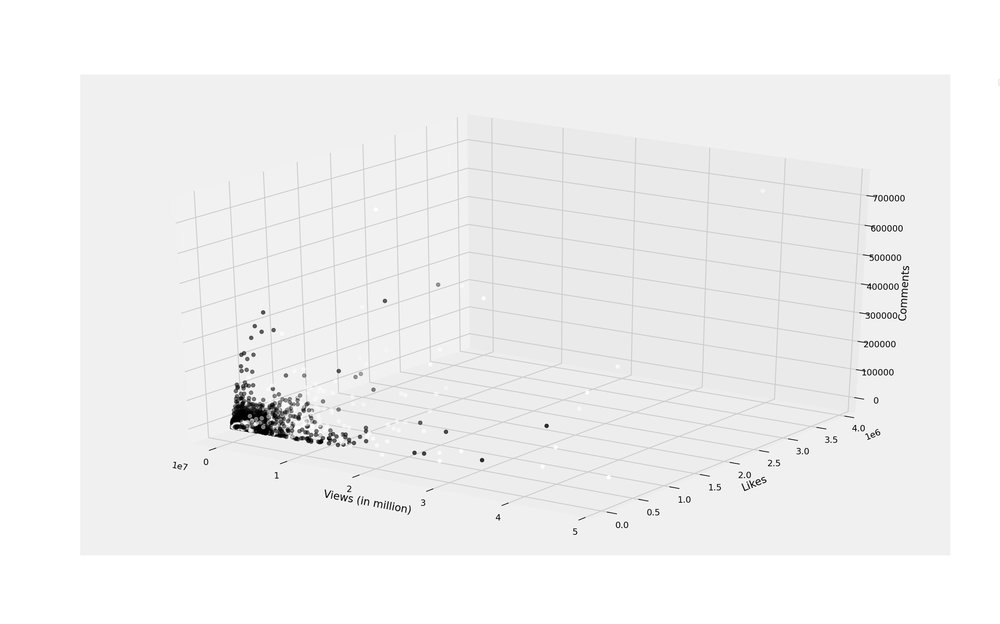

In [129]:
%matplotlib notebook

ax = plt.figure(figsize=(16,10)).gca(projection='3d')

xs = X_3['views']
ys = X_3['likes']
zs = X_3['comment_count']

sc = ax.scatter(xs,ys,zs,
                c=y,
#                 cmap='tab10',
#            cmap=cmap,
#            alpha=0.8,
)
ax.set_xlabel('Views (in million)')
ax.set_ylabel('Likes')
ax.set_zlabel('Comments')
# ax.legend
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

<IPython.core.display.Javascript object>


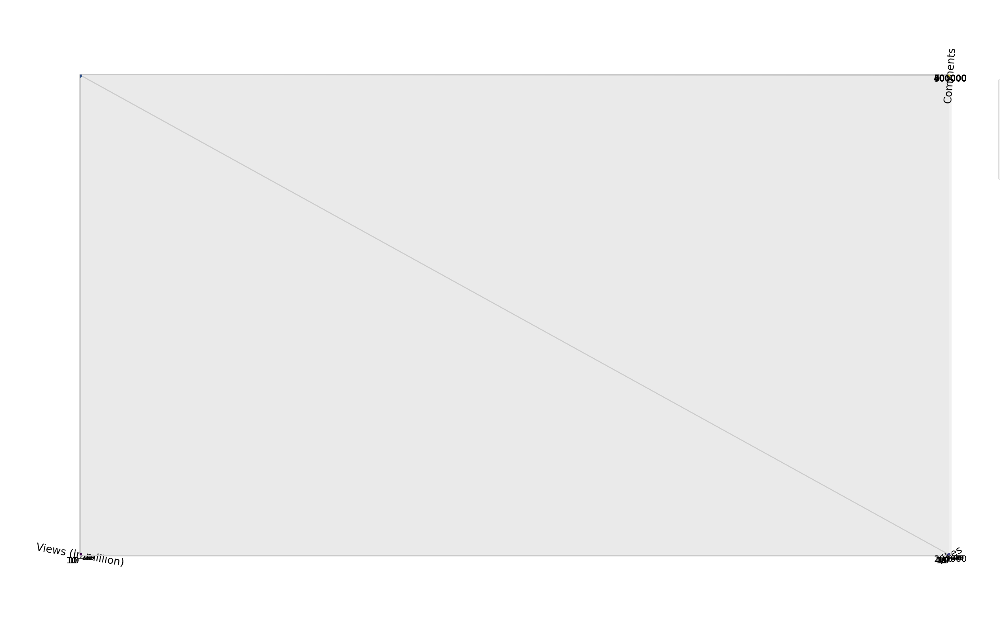

In [121]:
%matplotlib notebook

ax = plt.figure(figsize=(16,10)).gca(projection='3d')

xs = X_3['views']
ys = X_3['likes']
zs = X_3['comment_count']

sc = ax.scatter(xs,ys,zs,
                c=y,
                
#            cmap=cmap,
#            alpha=0.8,
)
ax.set_xlabel('Views (in million)')
ax.set_ylabel('Likes')
ax.set_zlabel('Comments')
plt.legend(*sc.legend_elements(), bbox_to_anchor=(1.05, 1), loc=2)
plt.show()

In [119]:
# Import dependencies
import plotly
import plotly.graph_objs as go

# Configure Plotly to be rendered inline in the notebook.
plotly.offline.init_notebook_mode()

x = X_3['views']
y = X_3['likes']
z = X_3['comment_count']

trace = go.Scatter3d(
    x=x,  # <-- Put your data instead
    y=y,  # <-- Put your data instead
    z=z,  # <-- Put your data instead
    mode='markers',
    marker={
        'size': 10,
        'opacity': 0.8,
    }
)

# Configure the layout.
layout = go.Layout(
    margin={'l': 0, 'r': 0, 'b': 0, 't': 0}
)

data = [trace]

plot_figure = go.Figure(data=data, layout=layout)

# Render the plot.
plotly.offline.iplot(plot_figure)

### Bernoulli Naive Bayes

In [64]:
from sklearn.naive_bayes import BernoulliNB

BNB = BernoulliNB()
BNB.fit(X_train, y_train)

BernoulliNB(alpha=1.0, binarize=0.0, class_prior=None, fit_prior=True)

In [65]:
BNB.score(X_test, y_test)

0.9700951315053161

In [66]:
BNB_cvs = cross_val_score(BNB, X, y, 
                          cv=10, 
                          n_jobs=-1,)

print(f"GaussianNB 10-CV score: {BNB_cvs}")
print(f"GaussianNB 10-fold Cross Val Avg: {np.mean(BNB_cvs)}")

GaussianNB 10-CV score: [0.97011752 0.97011752 0.97011752 0.97011752 0.97011752 0.97011752
 0.97017348 0.97017348 0.97017348 0.97017181]
GaussianNB 10-fold Cross Val Avg: 0.9701397323548177


### Wouldn't make sense to be using the following types of NB

In [73]:
from sklearn.naive_bayes import MultinomialNB, CategoricalNB, ComplementNB

MNB = MultinomialNB()
MNB.fit(X_train, y_train)

MultinomialNB(alpha=1.0, class_prior=None, fit_prior=True)

In [74]:
MNB.score(X_test, y_test)

0.6413430330162283

In [75]:
MNB_cvs = cross_val_score(MNB, X, y, 
                          cv=10, 
                          n_jobs=-1,)

print(f"GaussianNB 10-CV score: {MNB_cvs}")
print(f"GaussianNB 10-fold Cross Val Avg: {np.mean(MNB_cvs)}")

GaussianNB 10-CV score: [0.67879127 0.63335199 0.59893677 0.57795187 0.83284835 0.8351427
 0.61975378 0.5729155  0.49423615 0.53008003]
GaussianNB 10-fold Cross Val Avg: 0.6374008398434631


#### As expected, Multinomial NB performs terribly ^^

In [76]:
CoNB = ComplementNB()
CoNB.fit(X_train, y_train)

ComplementNB(alpha=1.0, class_prior=None, fit_prior=True, norm=False)

In [77]:
CoNB.score(X_test, y_test)

0.637806379406827

In [78]:
CoNB_cvs = cross_val_score(CoNB, X, y, 
                          cv=10, 
                          n_jobs=-1,)

print(f"GaussianNB 10-CV score: {CoNB_cvs}")
print(f"GaussianNB 10-fold Cross Val Avg: {np.mean(CoNB_cvs)}")

GaussianNB 10-CV score: [0.67739228 0.62809177 0.593061   0.57313934 0.83161724 0.83273643
 0.61773923 0.56933408 0.49076665 0.52761766]
GaussianNB 10-fold Cross Val Avg: 0.6341495669706877


#### Categorical or Complement NB don't make sense either

In [131]:
df_nostr.to_csv('yt_allcountry_trend5days_nostr.csv',index=None)